# FFI Poisson

Estimate the background, read noise, and photon noise.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
from astropy.io import fits
import astropy.visualization
from fast_histogram import histogram1d

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Campaign 13 is the most recent campaign we have available.  
Let's download it from the [K2 FFI MAST portal](https://archive.stsci.edu/pub/k2/ffi/).  We'll get both the FFI itself and its `unc` companion file.

In [4]:
hdu = fits.open('/Volumes/Truro/ffi/ktwo2017079075530-c13_ffi-cal.fits')

In [5]:
hdu.info()

Filename: /Volumes/Truro/ffi/ktwo2017079075530-c13_ffi-cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      57   ()      
  1  MOD.OUT 2.1    1 ImageHDU        99   (1132, 1070)   float32   
  2  MOD.OUT 2.2    1 ImageHDU        99   (1132, 1070)   float32   
  3  MOD.OUT 2.3    1 ImageHDU        99   (1132, 1070)   float32   
  4  MOD.OUT 2.4    1 ImageHDU        99   (1132, 1070)   float32   
  5  MOD.OUT 3.1    1 ImageHDU        66   (1132, 1070)   float32   
  6  MOD.OUT 3.2    1 ImageHDU        66   (1132, 1070)   float32   
  7  MOD.OUT 3.3    1 ImageHDU        66   (1132, 1070)   float32   
  8  MOD.OUT 3.4    1 ImageHDU        66   (1132, 1070)   float32   
  9  MOD.OUT 4.1    1 ImageHDU        66   (1132, 1070)   float32   
 10  MOD.OUT 4.2    1 ImageHDU        66   (1132, 1070)   float32   
 11  MOD.OUT 4.3    1 ImageHDU        66   (1132, 1070)   float32   
 12  MOD.OUT 4.4    1 ImageHDU        66   (1132, 1070)   float3

The FFIs are comprised of many individual modules and channels, etc.  Let's look at one of them.  Module 13 is near "on-axis" of the optical system: it's in the middle of the field of view and should therefore have better-than-average image quality.

In [6]:
mod13p1 = hdu['MOD.OUT 13.2']

In [7]:
mod13p1.data.shape

(1070, 1132)

In [8]:
mod13p1.data.min()

-347.58362

Negative values foil logarithmic transformations.  Add a bias value of 500.0

In [9]:
dat = mod13p1.data + 500.0
logdat = np.log10(dat)

In [10]:
minmax = astropy.visualization.MinMaxInterval()

In [11]:
vmin, vmax = minmax.get_limits(logdat)
vmin, vmax

(2.1830316, 5.343565)

In [13]:
x = np.linspace(vmin, vmax, 200)
y = histogram1d(logdat.reshape(-1), bins=200, range=(vmin, vmax))

Let's improve the *screen stretch* for readability.

In [14]:
good_interval = astropy.visualization.AsymmetricPercentileInterval(10, 95.0)
vmin, vmax = good_interval.get_limits(logdat)

In [15]:
norm = astropy.visualization.ImageNormalize(vmin=10**vmin, vmax=10**vmax)

In [16]:
data = dat[270:-50, 270:-50]

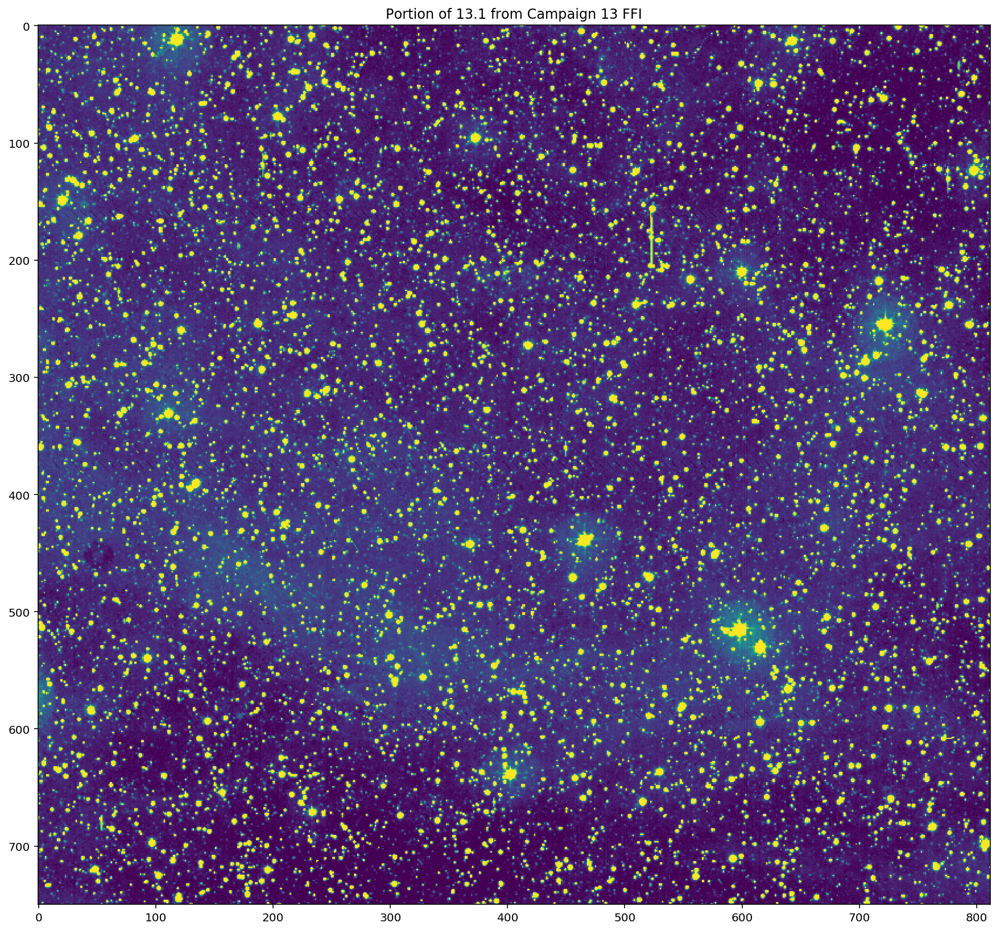

In [17]:
plt.figure(figsize=(15,15))
plt.imshow(data, norm=norm)
plt.title('Portion of 13.1 from Campaign 13 FFI')
plt.savefig('demo_FFI_13p2_data.png', dpi=300, bbox_inches='tight');

There is some structure in the background.

In [18]:
from astropy.stats import sigma_clipped_stats
mean, median, std = sigma_clipped_stats(data, sigma=3.0, iters=5)
print((mean, median, std))    

(837.96012634093347, 836.823974609375, 8.7762992766501533)


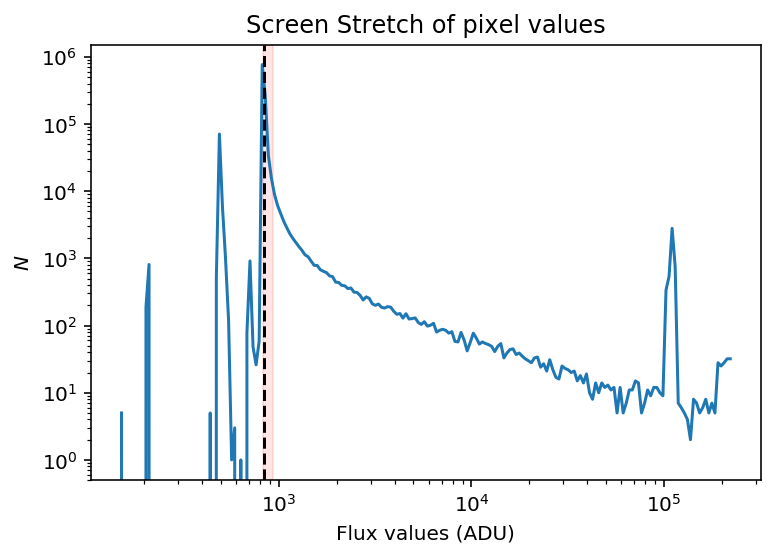

In [19]:
plt.plot(10**x, y)
plt.axvspan(10**vmin, 10**vmax, alpha=0.1, color='r')
plt.axvline(836.8, color='k', linestyle='dashed')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Flux values (ADU)')
plt.ylabel('$N$')
plt.title('Screen Stretch of pixel values');

That's a good background estimate!

Let's try a more aggressive technique:

In [20]:
from photutils import make_source_mask
mask = make_source_mask(data, snr=2, npixels=5, dilate_size=11)
mean, median, std = sigma_clipped_stats(data, sigma=3.0, mask=mask)
print((mean, median, std))    

(833.93184319380669, 833.7259521484375, 6.0500724886821438)


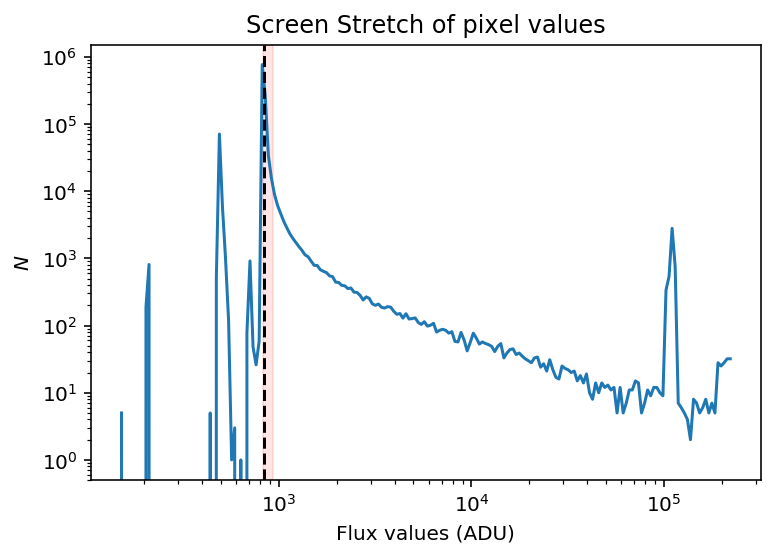

In [21]:
plt.plot(10**x, y)
plt.axvspan(10**vmin, 10**vmax, alpha=0.1, color='r')
plt.axvline(833.7, color='k', linestyle='dashed')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Flux values (ADU)')
plt.ylabel('$N$')
plt.title('Screen Stretch of pixel values');

In [22]:
data2 = data

In [23]:
from astropy.stats import SigmaClip
from photutils import Background2D, MedianBackground
sigma_clip = SigmaClip(sigma=3., iters=10)
bkg_estimator = MedianBackground()
bkg = Background2D(data2, (50, 50), filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)

In [24]:
bkg.background_median, bkg.background_rms_median

(841.12499292179655, 4.4805244190907301)

In [25]:
good_interval = astropy.visualization.AsymmetricPercentileInterval(10, 95.0)
vmin, vmax = good_interval.get_limits(np.log10(bkg.background))

In [27]:
new_norm = astropy.visualization.ImageNormalize(vmin=10**vmin, vmax=10**vmax)

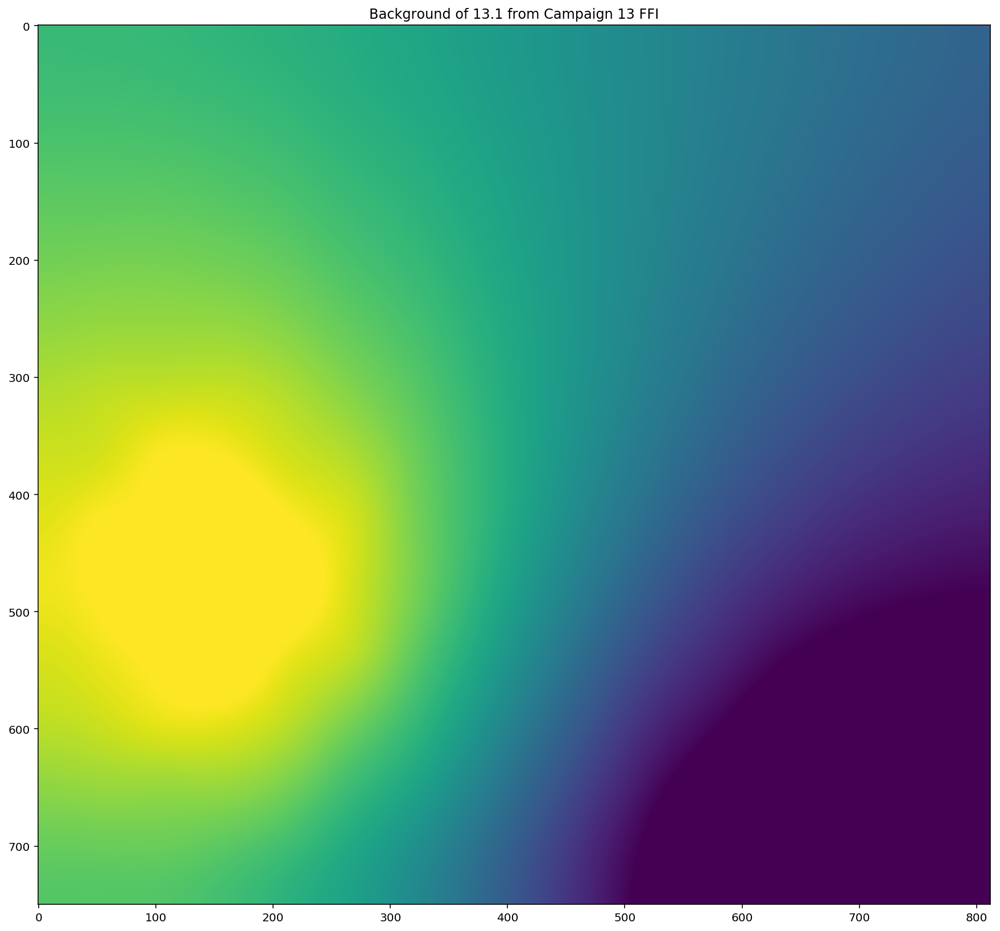

In [28]:
plt.figure(figsize=(15,15))
plt.imshow(bkg.background, norm=new_norm)
plt.title('Background of 13.1 from Campaign 13 FFI')
#plt.savefig('demo_FFI_13p2_data.png', dpi=300, bbox_inches='tight');

Doesn't seem amazing.

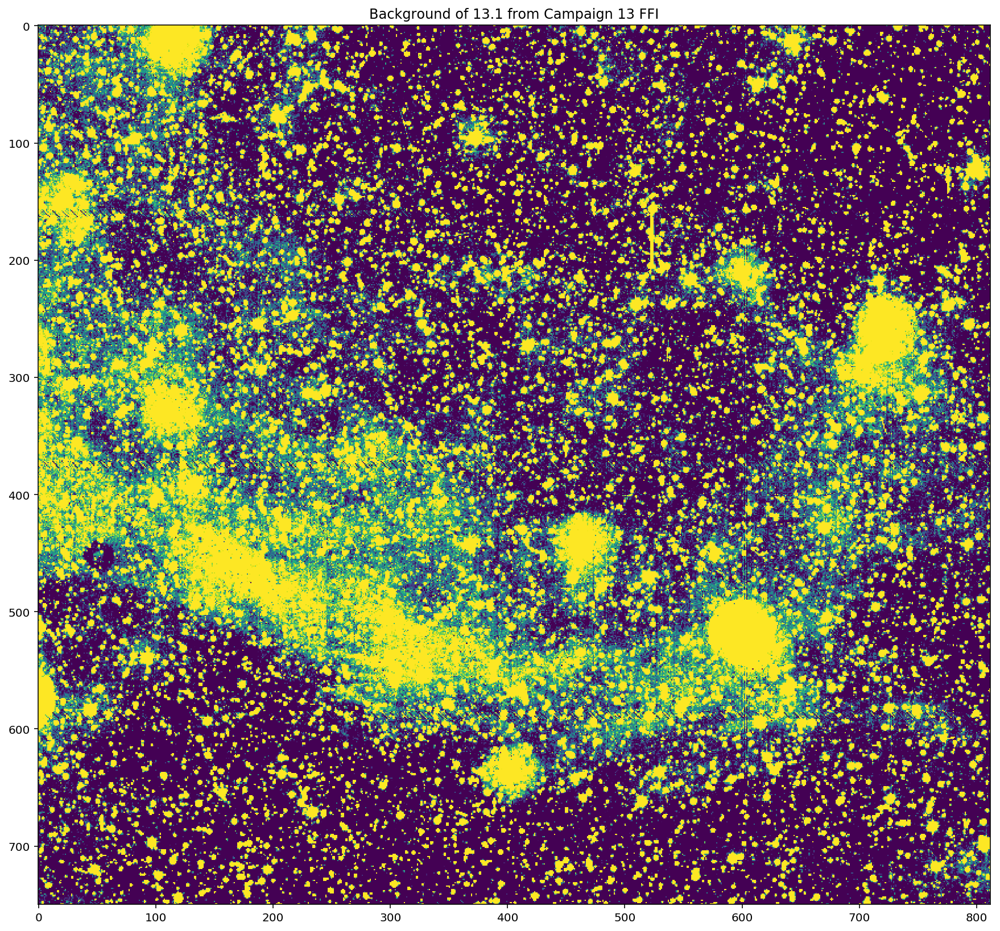

In [29]:
plt.figure(figsize=(15,15))
plt.imshow(data, norm=new_norm)
plt.title('Background of 13.1 from Campaign 13 FFI')
#plt.savefig('demo_FFI_13p2_data.png', dpi=300, bbox_inches='tight');

Just make a flat background.

In [30]:
dim_x, dim_y = data.shape

In [31]:
flat_bkg = 0.0 + 4.48*np.random.randn(dim_x, dim_y)

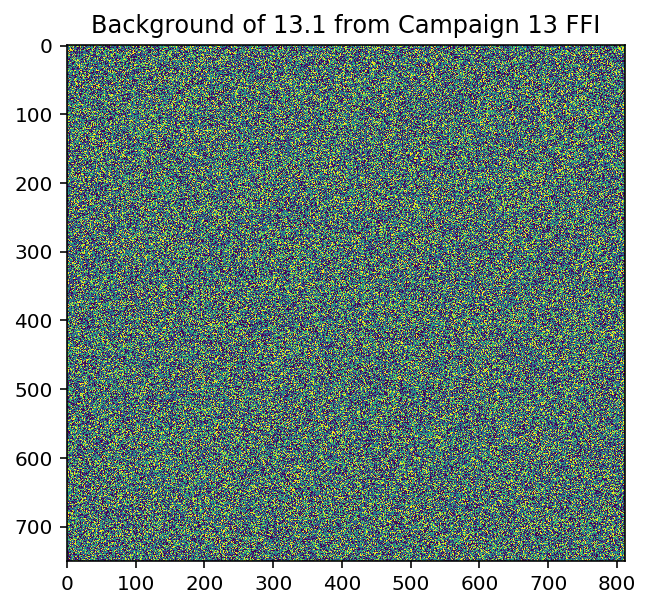

In [32]:
plt.figure(figsize=(5,5))
plt.imshow(840+flat_bkg, norm=new_norm)
plt.title('Background of 13.1 from Campaign 13 FFI')
#plt.savefig('demo_FFI_13p2_data.png', dpi=300, bbox_inches='tight');

## Poisson noise

What matters is the 6-second reads, so we will background subtract the data, divide by 270, and use that as a mean rate parameter.

In [33]:
rate = (dat - 834.0)

In [34]:
rate[rate< -100] = 0

In [35]:
rate_mu = np.abs(rate / 270.0)

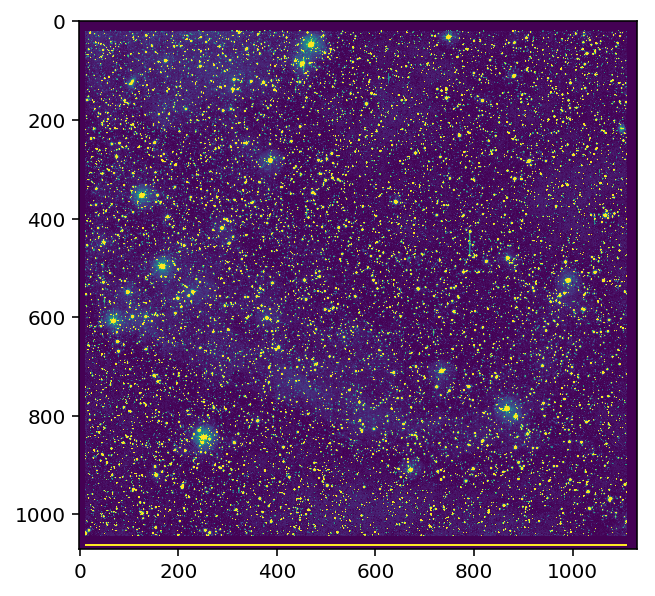

In [36]:
plt.figure(figsize=(5,5))
plt.imshow(rate_mu, norm=astropy.visualization.ImageNormalize(vmin=0, vmax=0.5))

In [37]:
from scipy.stats import poisson

In [38]:
pois_noise = poisson.rvs(rate_mu)

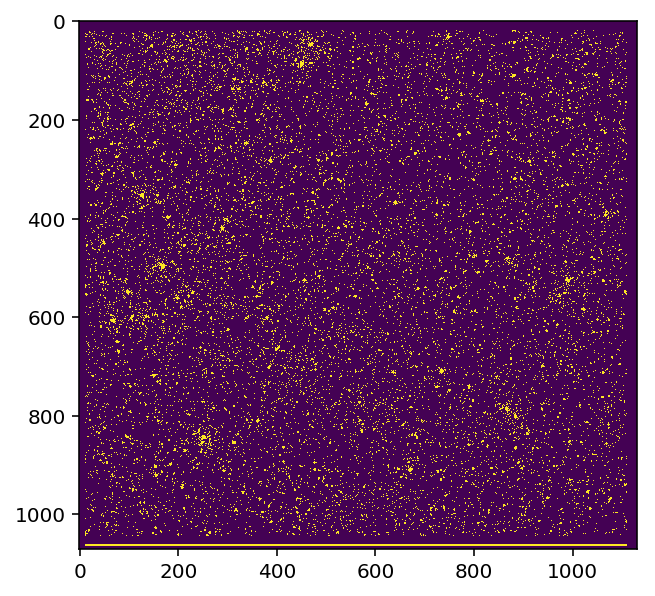

In [39]:
plt.figure(figsize=(5,5))
plt.imshow(pois_noise, norm=astropy.visualization.ImageNormalize(vmin=0, vmax=0.5))

Seems about right

In [40]:
vals = np.sqrt(np.abs(rate_mu))/np.std(flat_bkg)
vmin, vmax = np.min(vals), np.max(vals)
x = np.linspace(vmin, vmax, 200)
y = histogram1d(vals.reshape(-1), bins=200, range=(vmin, vmax))

/Users/obsidian/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in sqrt
  """Entry point for launching an IPython kernel.


/Users/obsidian/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in sqrt
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/obsidian/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in sqrt


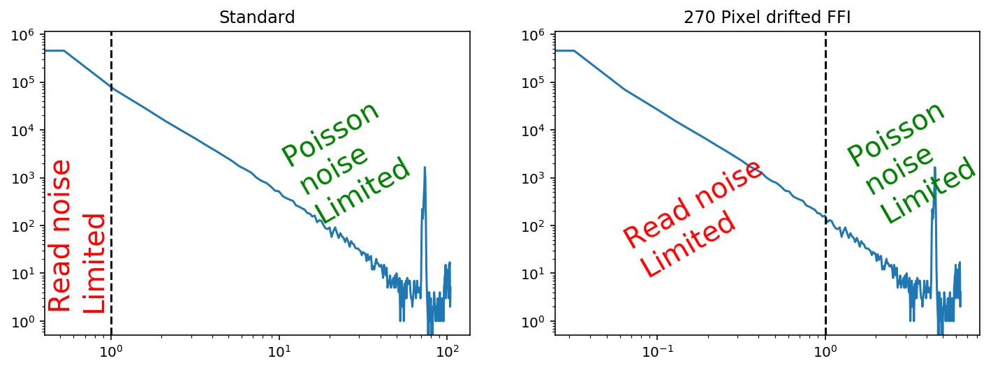

In [41]:
plt.figure(figsize=(12, 4))

vals = np.sqrt(np.abs(rate))/np.std(flat_bkg)
vmin, vmax = np.min(vals), np.max(vals)
x = np.linspace(vmin, vmax, 200)
y = histogram1d(vals.reshape(-1), bins=200, range=(vmin, vmax))

plt.subplot(121)
plt.plot(x, y)
plt.yscale('log')
plt.xscale('log')
plt.axvline(1, color='k', linestyle='dashed')
plt.text(10.0, 1.0E3, 'Poisson \nnoise \nLimited', fontsize=20, rotation=30, color='g');
plt.text(0.42, 3.0E2, 'Read noise \nLimited', fontsize=20, rotation=90, color='r')
plt.title('Standard');


vals = np.sqrt(np.abs(rate_mu))/np.std(flat_bkg)
vmin, vmax = np.min(vals), np.max(vals)
x = np.linspace(vmin, vmax, 200)
y = histogram1d(vals.reshape(-1), bins=200, range=(vmin, vmax))

plt.subplot(122)
plt.plot(x, y)
plt.yscale('log')
plt.xscale('log')
plt.axvline(1, color='k', linestyle='dashed')
plt.text(1.3, 1.0E3, 'Poisson \nnoise \nLimited', fontsize=20, rotation=30, color='g');
plt.text(0.06, 3.0E2, 'Read noise \nLimited', fontsize=20, rotation=30, color='r')
plt.title('270 Pixel drifted FFI');

Basically, more pixels are readnoise dominated in a drift-scan mode.  The threshold moves by a factor of:

In [42]:
np.sqrt(270)

16.431676725154983

## Drift mode

Neat! Stars and some artifacts.

In [43]:
250*12

3000

In [44]:
0.5/4

0.125

What does the above image look like if the telescope is drifing through the sky?

Assume the drift rate is: 
$$\omega_d = \dot \theta = 0.5^{\circ} /\mathrm{hour}$$

$$= 0.5^{''} /\mathrm{sec}$$
$$= 0.125 \;\mathrm{pixels}/\mathrm{sec}$$

Kepler possesses both photon accumulation time and a read time:  

$$t_{int} = 6.02 \;\mathrm{sec}$$
$$t_{read} = 0.52 \;\mathrm{sec}$$

$t_{int}$ is the photon accumulation time per frame, while $t_{read}$ is the readout time per frame.

So with $0.5^{\circ} /\mathrm{hour}$ motion, we will have:
$$0.125 \; \frac{\mathrm{pixels}}{\mathrm{sec}} \times 6.54 \; \frac{\mathrm{sec}}{1}$$  
$$0.8175 \; \frac{\mathrm{pixels}}{\mathrm{frame}}$$  

There are 270 frames per net FFI exposure, yielding the 29.4 minute cadence we are used to.

In [45]:
0.125*6.54

0.8175

In [46]:
270.0*6.54/60

29.43

During the 270 frame exopsure, the *net drift* is about 220 pixels:

In [47]:
0.8175*270.0

220.725

Storing and reading out the FFI to the Solid State Recorder (SSR) takes about 15-20 minutes (priv. comm. from Marcie Smith and Doug Caldwell).  That's a shutter open time duty cycle of about:

In [48]:
29.4/(29.4+20)

0.5951417004048583

In [49]:
0.125*20*60.0

150.0

Realistically what this means is that frames will have 220-pixel-long streaks interrupted by an equivalent 150-pixel-long gap in data.

In [50]:
t_int = 6.02
t_read = 0.52

Simulate movement in both $x$ and $y$:

In [51]:
omega_x, omega_y = np.sqrt(2)*0.125, np.sqrt(2)*0.125

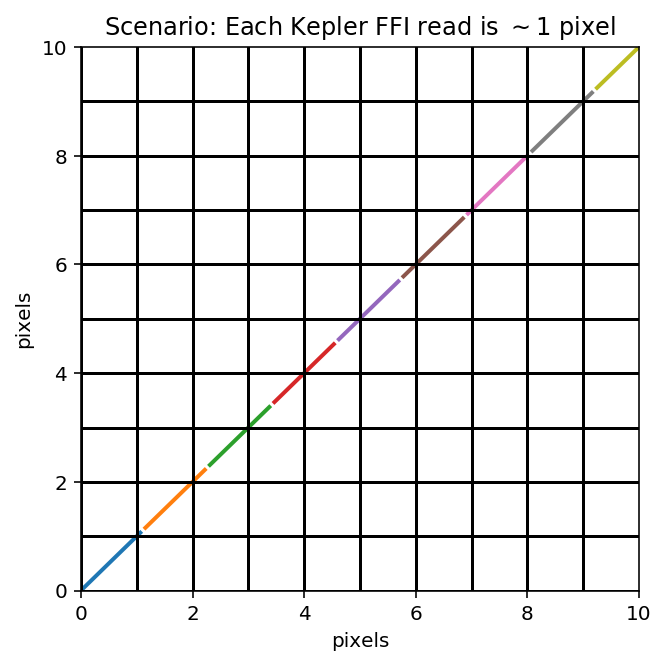

In [52]:
t0, t1, t2 = 0, 6.02, 6.54
x0, y0 = omega_x*t0, omega_y*t0
x1, y1 = omega_x*t1, omega_y*t1
x2, y2 = omega_x*t2, omega_y*t2

plt.figure(figsize=(5,5))

for frame_num in range(12):
    plt.plot([x0, x1], [y0, y1], lw = 2)    
    t0, t1 = t0+t2, t1+t2
    x0, y0 = omega_x*t0, omega_y*t0
    x1, y1 = omega_x*t1, omega_y*t1

for i in range(10):
    plt.axvline(i, color='k')
    plt.axhline(i, color='k')

plt.xlabel('pixels')
plt.ylabel('pixels')
plt.xlim(0,10)
plt.ylim(0,10)
plt.title('Scenario: Each Kepler FFI read is $\sim$1 pixel');

# Simulate the image motion

Let's round the image motion to the nearest integer to make our simulation computationally easier, otherwise we'd have to interpolate on a sub-pixel level. $$0.815 \; \frac{\mathrm{pixels}}{\mathrm{frame}} \approx 1 \frac{\mathrm{pixel}}{\mathrm{frame}}$$  

In [53]:
rolled = dat*0.0

In [54]:
npix = 270
for i in range(npix):
    del_roll = np.roll(np.roll(dat, i, 0), i,1)/270.0
    del_nois = np.roll(np.roll(poisson.rvs(rate_mu), i, 0), i,1)
    rolled = rolled + del_roll+ del_nois

In [55]:
logrolled = np.log10(rolled)

In [56]:
vmin, vmax = minmax.get_limits(logrolled)
vmin, vmax

(2.8859518735893337, 3.9497194931184958)

In [57]:
x = np.linspace(vmin, vmax, 200)
y = histogram1d(logrolled.reshape(-1), bins=200, range=(vmin, vmax))

In [58]:
good_interval = astropy.visualization.AsymmetricPercentileInterval(10, 60.0)
vmin, vmax = good_interval.get_limits(logrolled)

norm = astropy.visualization.ImageNormalize(vmin=10**vmin, vmax=10**vmax)

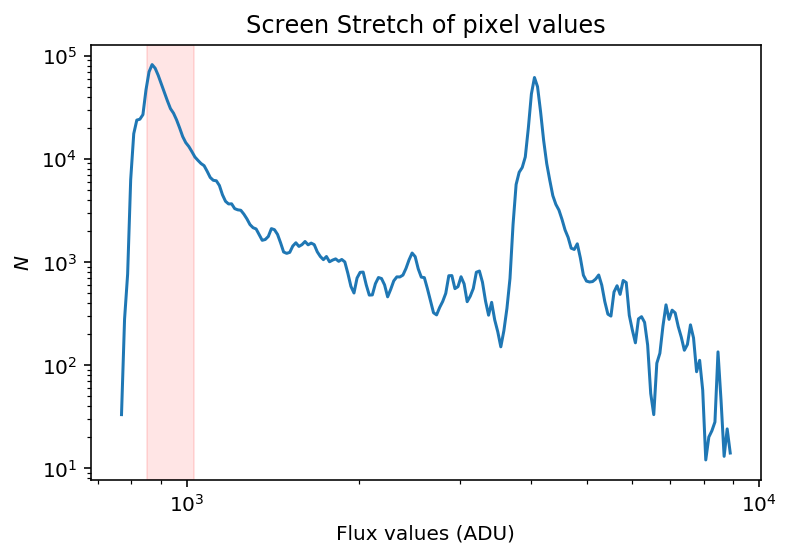

In [59]:
plt.plot(10**x, y)
plt.axvspan(10**vmin, 10**vmax, alpha=0.1, color='r')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Flux values (ADU)')
plt.ylabel('$N$')
plt.title('Screen Stretch of pixel values');

In [60]:
roll_dat = rolled[270:-50, 270:-50]

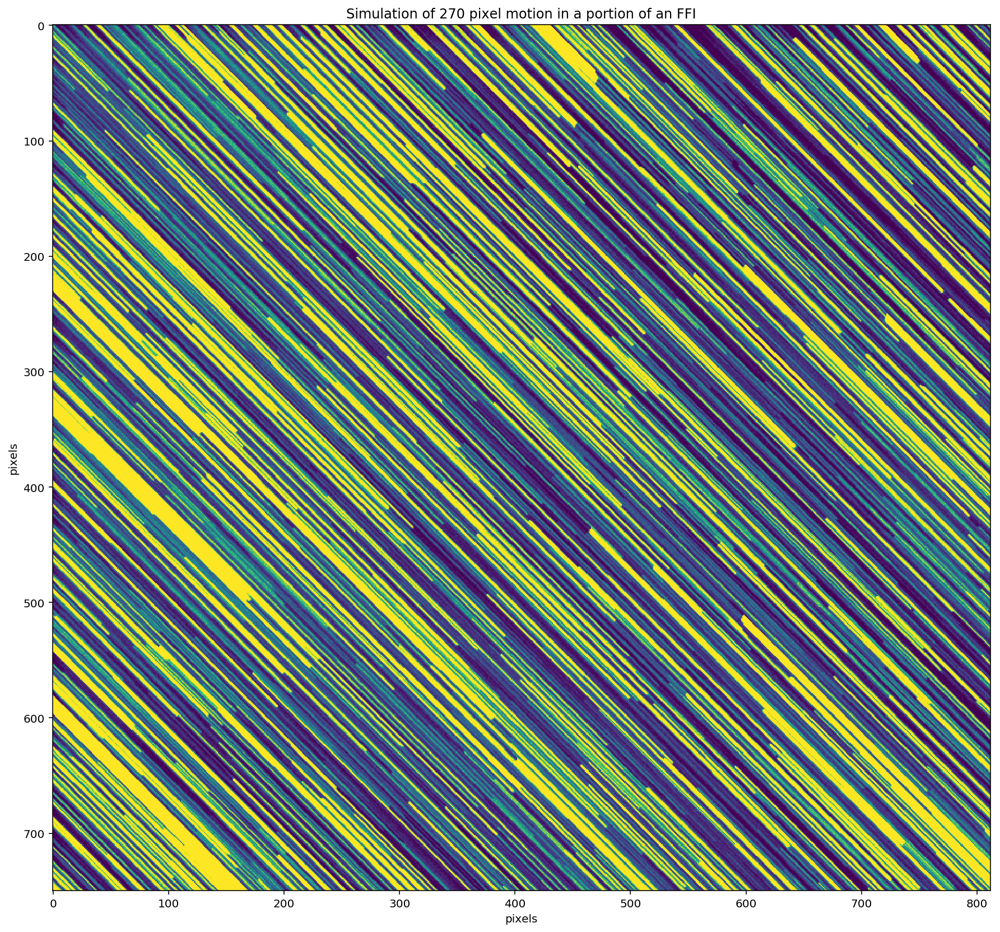

In [61]:
plt.figure(figsize=(15,15))
plt.imshow(roll_dat, norm=norm)
plt.title('Simulation of 270 pixel motion in a portion of an FFI')
plt.xlabel('pixels')
plt.ylabel('pixels')
plt.savefig('./TWSDDL_motion_270pix_FFI_mod13p2_orig.png', dpi=300,bbox_inches='tight');

Now with noise:

In [62]:
noisey_roll = roll_dat + flat_bkg

In [63]:
#good_interval = astropy.visualization.AsymmetricPercentileInterval(10, 60.0)
#vmin, vmax = good_interval.get_limits(np.log10(noisey_roll))

#norm = astropy.visualization.ImageNormalize(vmin=10**vmin, vmax=10**vmax)

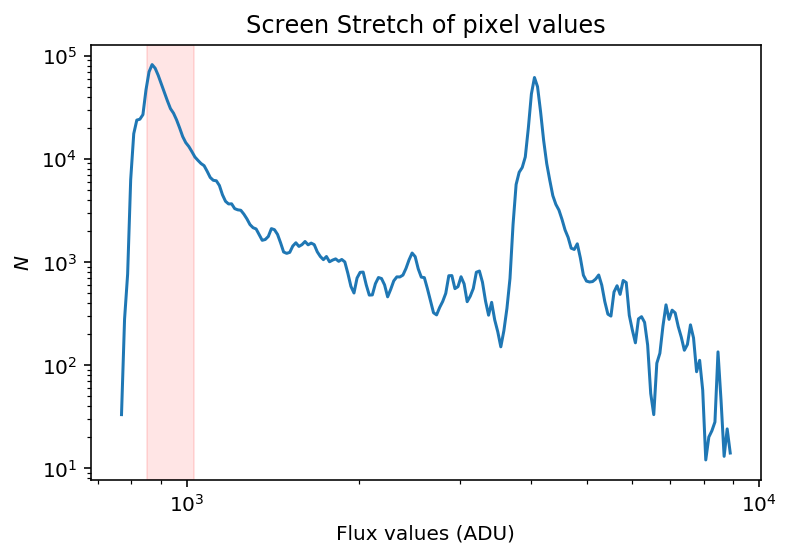

In [64]:
plt.plot(10**x, y)
plt.axvspan(10**vmin, 10**vmax, alpha=0.1, color='r')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Flux values (ADU)')
plt.ylabel('$N$')
plt.title('Screen Stretch of pixel values');

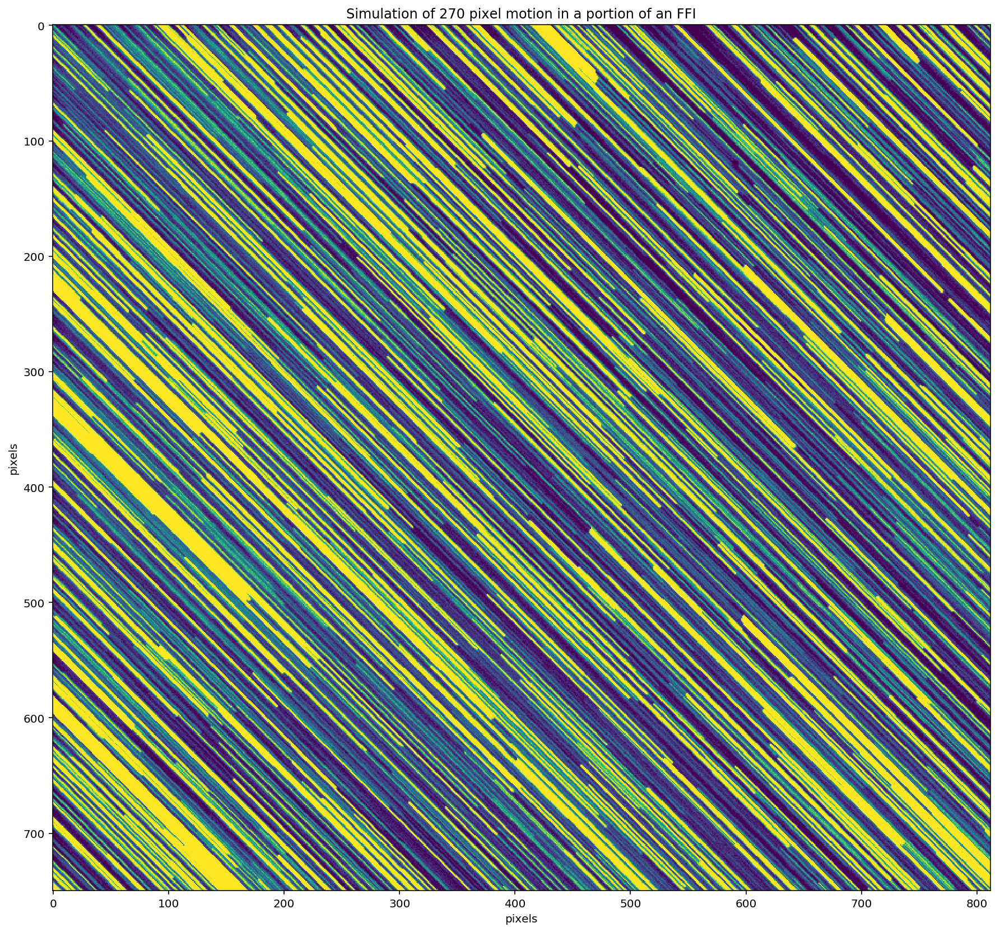

In [65]:
plt.figure(figsize=(15,15))
plt.imshow(noisey_roll, norm=norm)
plt.title('Simulation of 270 pixel motion in a portion of an FFI')
plt.xlabel('pixels')
plt.ylabel('pixels')
plt.savefig('./TWSDDL_motion_270pix_FFI_mod13p2_nois.png', dpi=300,bbox_inches='tight');

Lots of motion, but that can be helpful from a flat-fielding perspective.